In [2]:
import numpy as np
import matplotlib.pyplot as plt
import sys, os
import warnings; warnings.simplefilter('ignore')
import fitsio
from astropy.table import Table

from main_def import search_around, flux_to_mag, cut
from geometric_def import query_catalog_mask, LSLGA_fit, LSLGA_veto, circular_mask_radii_func


This notebook intends to spot binary stars that where classified as galaxies in BGS using GAIA. For this we use the GAIA catalogue matched with DECaLS that is available in the SWEEPS and perform nearest neighbor search with a `search radius` of `3 arcsec`. The starting up catalogue is the `180 < RA < 200` and `5 < DEC < 15` patch of `~200` deg$^2$, and `rmag < 20`. This catalogue contains all of this from the SWEEPS and it also contain a column of arrays called `CUTS` where if not empty the array points out which BGS mask (or masks) was applied to this object. 

## Sample catalogue #1

For this notebook we're going to use one of the output catalogues from the BGS pipeline that includes the masking column `CUTS`. More expecifications of the catalogue below:
    
    dr = dr7
    (180 < RA < 200) & (5 < DEC < 15)
    rmag < 20
    
    ----- CUTS column key -----
    0 = Bright Star: Kyle radii
    1 = Large Galaxy:major=D25/2
    2 = NOBS
    3 = ALLMASK
    4 = Star-Galaxy separation
    5 = Fibre Magnitude Cut
    6 = Colour Cuts
    7 = FRACS* 

In [3]:
path1 = '/global/homes/q/qmxp55/DESI/BGS_paper/dr7_180_200_5_15_rmag_20_N_2/kyle_Lkyle_Wkyle_D25_1_0_1_gaia_gal_2.9_-1_4_0.4_0.3_5_0/'
BGS = np.load(path1+'BGS_cat.npy')
BGS_ran = np.load(path1+'randoms_cat.npy')

## Sample catalogue #2

For this notebook we're going to use one of the output catalogues from the BGS pipeline that includes the masking column `CUTS`. More expecifications of the catalogue below:
    
    dr = dr8
    (134 < RA < 139) & (32 < DEC < 34)
    rmag < 20
    
    ----- CUTS column key -----
    0 = Bright Star: Dustin’s radii
    1 = Medium Star
    2 = Globular Cluster
    3 = Large Galaxy:major=D25/2
    4 = NOBS
    5 = ALLMASK
    6 = Star-Galaxy separation
    7 = Fibre Magnitude Cut
    8 = Colour Cuts
    9 = FRACS* 
    

In [4]:
#path1 = '/global/homes/q/qmxp55/DESI/BGS_paper/dr8c_v3.0_134_139_32_34_rmag_20_N_2/'
#BGS = np.load(path1+'BGS_cat.npy')

In [5]:
gaia = BGS['GAIA_PHOT_G_MEAN_MAG'] != 0
CUTOUT = BGS['CUTS'] != ''
#MS = BGS['CUTS'] == '1' #MS only
rmag = flux_to_mag(BGS['FLUX_R']/BGS['MW_TRANSMISSION_R'])
bright = rmag < 19.5
faint = rmag > 19.5
PSF = BGS['TYPE'] == 'PSF '
fibmag = flux_to_mag(BGS['FIBERFLUX_R']/BGS['MW_TRANSMISSION_R'])

layer_dr7='decals-dr7'
layer_dr8='r8c-decam'

In [6]:
#CUTOUT_ran = BGS_ran['CUTS'] != ''

In [7]:
#SGS = BGS['CUTS'] == '4' #Star-Galaxy only: dr7

In [8]:
def allinCut(ref):
    
    cut = np.zeros(len(BGS), dtype='?')
    for i in set(BGS['CUTS']):
        if ref in i:
            cut |= BGS['CUTS'] == i
            
    return cut

In [9]:
#Some cuts in DR7...
SGT = allinCut(ref='4')
LGT = allinCut(ref='1')
BST = allinCut(ref='0')

In [10]:
ramin, ramax, decmin, decmax = BGS['RA'].min(), BGS['RA'].max(), BGS['DEC'].min(), BGS['DEC'].max()

In [11]:
#Loading Tycho2 catalogue
path = '/global/homes/q/qmxp55/DESI/matches/'
tycho_ = fitsio.read(path+'tycho2.fits')
#cutting out to the same footprint as DECaLS catalogue
tycho = cut(ramin, ramax, decmin, decmax, tycho_)

In [12]:
#Loading the Legacy Survey Large Galaxy Atlas (href: https://github.com/moustakas/LSLGA)
LSLGA_ = fitsio.read('/global/project/projectdirs/desi/users/qmxp55/matches/LSLGA-v2.0.fits')
#cutting out to the same footprint as DECaLS catalogue
LSLGA = cut(ramin, ramax, decmin, decmax, LSLGA_)
#we have some nan's in PA (galaxy declination/angle) that end up with no ellipses in the postages...
masknans = (~np.isnan(LSLGA['PA'])) & (~np.isnan(LSLGA['BA'])) & (~np.isnan(LSLGA['D25']))
#replace nan's with zeroes
LSLGA['PA'][np.where(~masknans)] = 0
#LSLGA = LSLGA[masknans]

In [13]:
np.sum(~masknans)

667

## Postages centred at Bright Stars with Tycho...

In [14]:

def inTycho2(MASK):
    '''
    Match BGS cat with Tycho2
    
    Inputs:
    -------
    MASK: array:boolean:: Boolen array with Tycho2 size
    
    Returns:
    -------
    idx1: array: int:: BGS Index array of matched objects
    kyle_rad: array: float:: BGS array-like (same lenght as BGS) of Kyle's radius for Tycho2 Stars (if any) in arcsec
    Dustin_rad: array: float:: BGS array-like (same lenght as BGS) of Dustin's radius for Tycho2 Stars (if any) in arcsec
    '''
    
    if MASK is None:
        MASK = np.ones(len(tycho), bool)
        
    idx2, idx1, d2d, d_ra, d_dec = search_around(tycho['RA'][MASK], tycho['DEC'][MASK], BGS['RA'], 
                                             BGS['DEC'], search_radius=0.5)
    
    kyle_rad = np.zeros(len(BGS), float)
    dustin_rad = np.zeros(len(BGS), float)
    ty_mag = np.zeros(len(BGS), float)

    #dustin_rad2[idx1] = np.minimum(1800., 150. * 2.5**((11. - tycho['MAG_VT'][MASK][idx2])/3.)) * 0.262/1
    dustin_rad[idx1] = circular_mask_radii_func(tycho['MAG_VT'][MASK][idx2], Dustin_MS_radii, bestfit=False)
    kyle_rad[idx1] = circular_mask_radii_func(tycho['MAG_VT'][MASK][idx2], kyle_radii, bestfit=True)
    ty_mag[idx1] = tycho['MAG_VT'][MASK][idx2]
    
    return idx1, kyle_rad, dustin_rad
    

### Bleed trail test: close up in bright stars

In [59]:
TyMagMask = (tycho['MAG_VT'] < 11.) & (tycho['MAG_VT'] > 10.)
Tyidx1, Ty_kyle_rad, Ty_dustin_rad = inTycho2(MASK=TyMagMask)

360 nearby objects ~ 0.0507309 %


Central coords in postage: RA:180.649629316968, DEC:6.921592986313, Cidx:90918, rad:30
Central coords in postage: RA:189.791301634045, DEC:14.325222789284, Cidx:217282, rad:37
Central coords in postage: RA:180.319469821940, DEC:7.142185516100, Cidx:102869, rad:35
Central coords in postage: RA:183.535574438325, DEC:5.405236229223, Cidx:65444, rad:29
Central coords in postage: RA:192.943818871650, DEC:10.672821443823, Cidx:646392, rad:31
Central coords in postage: RA:193.761875980160, DEC:8.131616529078, Cidx:520041, rad:32


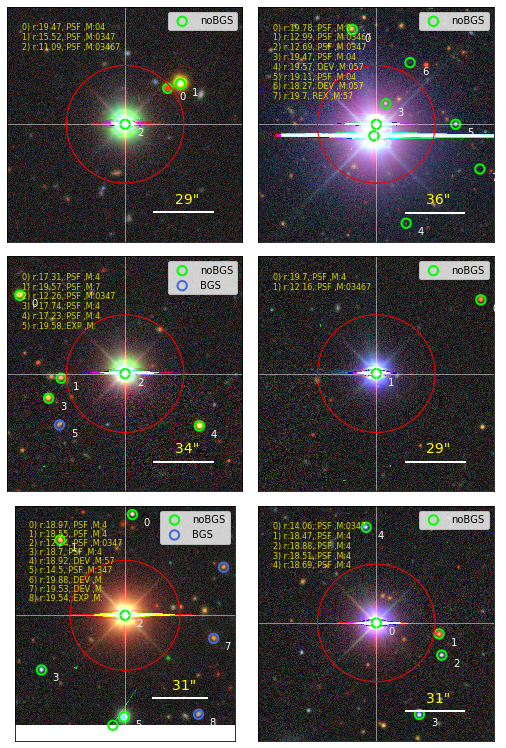

In [63]:
veto1 = {'noBGS':CUTOUT, 'BGS':~CUTOUT}
info1 = {'r':rmag, '':BGS['TYPE'],'M':BGS['CUTS']}

postages_circle(coord=[BGS['RA'], BGS['DEC']], centeridx=Tyidx1[:6], veto=veto1, info=info1, scale=0.262, 
                scale_unit='pixscale', layer=layer_dr7, radius=Ty_kyle_rad/3600., m=2, grid=[3,2], 
                savefile='bleed_trail_dr7_cat', layer2=None, layer2Mode='separate')


In [61]:
RA_ran_New = np.concatenate((BGS_ran['RA'], BGS['RA'][Tyidx1[:6]]))
DEC_ran_New = np.concatenate((BGS_ran['DEC'], BGS['DEC'][Tyidx1[:6]]))
CUTS_ran = np.concatenate((BGS_ran['CUTS'], BGS['CUTS'][Tyidx1[:6]]))
print(len(BGS_ran['RA']), len(RA_ran_New))
#match previous stars with the randoms to get closets centre to the same stars...
idx2, idx1, d2d, d_ra, d_dec = search_around(BGS['RA'][Tyidx1[:6]], BGS['DEC'][Tyidx1[:6]], 
                                             RA_ran_New, DEC_ran_New, search_radius=0.1)

Ty_kyle_rad_ran = np.zeros(len(RA_ran_New), float)
Ty_kyle_rad_ran[idx1] = Ty_kyle_rad[Tyidx1[:6]]
CUTOUT_ran = CUTS_ran != ''

3932291 3932297
6 nearby objects ~ 0.000152583 %


Central coords in postage: RA:189.791301634045, DEC:14.325222789284, Cidx:3932292, rad:37
Central coords in postage: RA:183.535574438325, DEC:5.405236229223, Cidx:3932291, rad:29
Central coords in postage: RA:180.649629316968, DEC:6.921592986313, Cidx:3932295, rad:30
Central coords in postage: RA:192.943818871650, DEC:10.672821443823, Cidx:3932294, rad:31
Central coords in postage: RA:180.319469821940, DEC:7.142185516100, Cidx:3932296, rad:35
Central coords in postage: RA:193.761875980160, DEC:8.131616529078, Cidx:3932293, rad:32


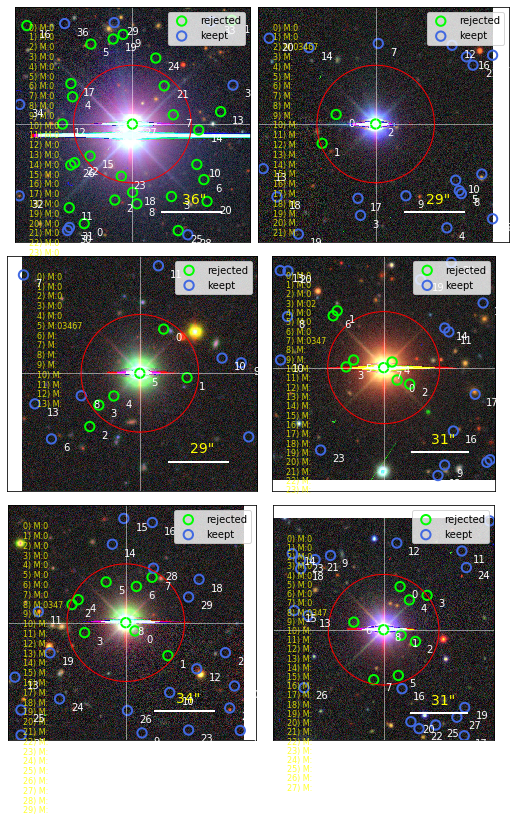

In [64]:
veto_ran = {'rejected':CUTOUT_ran, 'keept':~CUTOUT_ran}
info_ran = {'M':CUTS_ran}

postages_circle(coord=[RA_ran_New, DEC_ran_New], centeridx=idx1, veto=veto_ran, info=info_ran, scale=0.262, 
                scale_unit='pixscale', layer=layer_dr7, radius=Ty_kyle_rad_ran/3600., m=2, grid=[3,2], 
                savefile='bleed_trail_dr7_randoms', layer2=None, layer2Mode='separate')


## Large Galaxies postages with LSLGA...

In [19]:
def inLSLGA(MASK):
    '''
    Match BGS cat with LSLGA
    
    Inputs:
    -------
    MASK: array:boolean:: Boolen array with LSLGA size
    
    Returns:
    -------
    idx1: array: int:: BGS Index array of matched objects
    radius_LG: 3D-array: float:: BGS array-like (same lenght as BGS) of LSLGA major, minor and angle params
    '''
    
    if MASK is None:
        MASK = np.ones(len(LSLGA), bool)
        
    idx2, idx1, d2d, d_ra, d_dec = search_around(LSLGA['RA'][MASK], LSLGA['DEC'][MASK], BGS['RA'], 
                                             BGS['DEC'], search_radius=0.3)
    
    major = np.zeros(len(BGS), float)
    minor = np.zeros(len(BGS), float)
    angle = np.zeros(len(BGS), float)

    major[idx1] = LSLGA['D25'][MASK][idx2]/2./60.
    minor[idx1] = major[idx1]*LSLGA[MASK]['BA'][idx2]
    angle[idx1] = 90 - LSLGA['PA'][MASK][idx2]
    
    radius_LG = np.array([major, minor, angle]).T
    
    return idx1, radius_LG

In [20]:
#LGMagMASK = (LSLGA['MAG'] < 14.5) & (LSLGA['MAG'] > 13)
LGMagMASK = (~masknans) & (LSLGA['MAG'] < 14.5) & (LSLGA['MAG'] > 13)
LG_idx1, radius_LG = inLSLGA(MASK=LGMagMASK)

15 nearby objects ~ 0.00211379 %


Central coords in postage: RA:186.023028008244, DEC:7.041248356866, Cidx:120095, rad:36
Central coords in postage: RA:184.497514034360, DEC:5.598624119559, Cidx:70900, rad:26
Central coords in postage: RA:185.842787940413, DEC:6.040741501168, Cidx:113071, rad:24
Central coords in postage: RA:190.536110488390, DEC:11.754289652997, Cidx:586575, rad:29
Central coords in postage: RA:184.533732185501, DEC:6.139560612568, Cidx:71206, rad:23
Central coords in postage: RA:185.911221983397, DEC:6.954027067454, Cidx:120000, rad:58
Central coords in postage: RA:185.013727230354, DEC:14.961507161661, Cidx:294297, rad:39
Central coords in postage: RA:186.617896328455, DEC:9.019861861302, Cidx:152451, rad:19


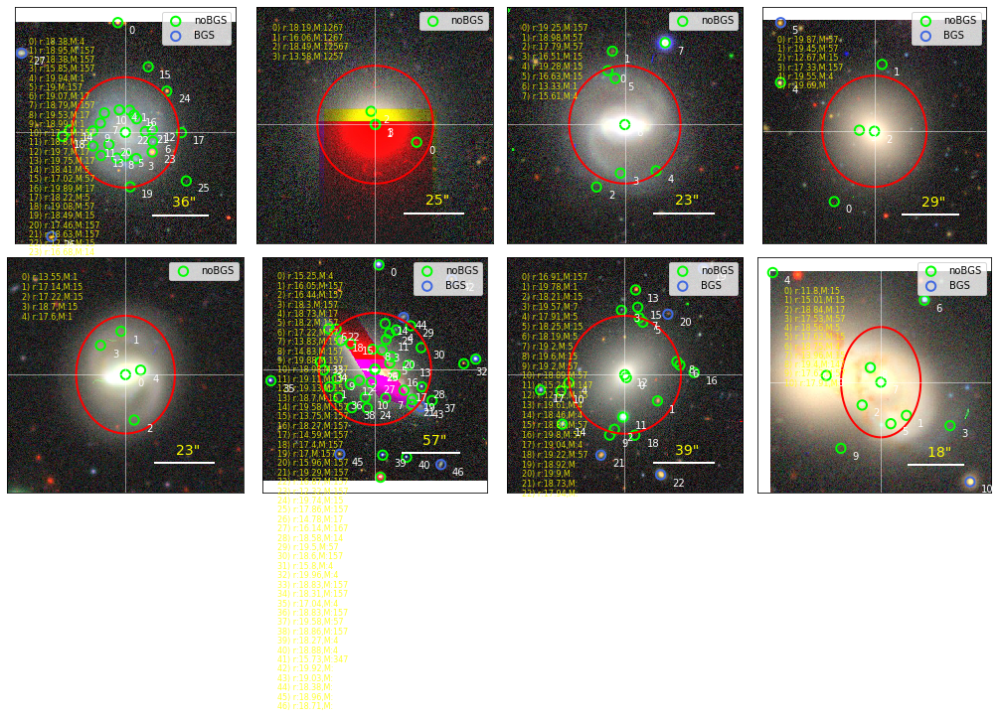

In [23]:
veto2 = {'noBGS':CUTOUT, 'BGS':~CUTOUT}
info2 = {'r':rmag,'M':BGS['CUTS']}

postages_circle(coord=[BGS['RA'], BGS['DEC']], centeridx=LG_idx1, veto=veto2, info=info2, scale=0.262, 
                scale_unit='pixscale', layer=layer_dr7, radius=radius_LG, m=2, grid=[2,4], 
                savefile=None, layer2=None, layer2Mode='separate', isLG=True)

# FMC rejecting LG?

Here we are gonna get the number of LSLGA galaxies that are being rejected by FMC

In [15]:
#Matching all LSLGA galaxies with catalogue (remember, the catalogue is called BGS but it cotains everything...)
def LSLGAinFMC(cut_id='5'):
    
    idx2, idx1, d2d, d_ra, d_dec = search_around(LSLGA['RA'], LSLGA['DEC'], BGS['RA'], 
                                             BGS['DEC'], search_radius=0.1)
    
    inFMCidx = []
    for i in idx1:
        if cut_id in BGS['CUTS'][i]: #for dr7
        #if '7' in BGS['CUTS'][i]: #for dr8
            inFMCidx.append(i)
    
    print('%d LSLGA out of %d are being rejected by FMC too --> %2.3g %%' %(len(inFMCidx), len(idx1), 100*(len(inFMCidx)/len(idx1))))
    
    major = np.zeros(len(BGS), float)
    minor = np.zeros(len(BGS), float)
    angle = np.zeros(len(BGS), float)

    #major[idx1] = LSLGA['D25'][idx2]/2./60. #major in DR8
    major[idx1] = LSLGA['D25'][idx2]/60. #major in DR7 -- twice as DR8
    minor[idx1] = major[idx1]*LSLGA['BA'][idx2]
    angle[idx1] = 90 - LSLGA['PA'][idx2]
    
    radius_LG = np.array([major, minor, angle]).T
    
    return np.array(inFMCidx), radius_LG

In [16]:
inBSidx, rad_ = LSLGAinFMC(cut_id='0')
inLGidx, rad_ = LSLGAinFMC(cut_id='1')
inNOBSidx, rad_ = LSLGAinFMC(cut_id='2')
inALLMASKidx, rad_ = LSLGAinFMC(cut_id='3')
inSGSidx, rad_ = LSLGAinFMC(cut_id='4')
inFMCidx, rad_ = LSLGAinFMC(cut_id='5')
inCCidx, rad_ = LSLGAinFMC(cut_id='6')
inQCidx, rad_ = LSLGAinFMC(cut_id='7')

1094 nearby objects ~ 0.154165 %
4 LSLGA out of 1094 are being rejected by FMC too --> 0.366 %
1094 nearby objects ~ 0.154165 %
1094 LSLGA out of 1094 are being rejected by FMC too --> 100 %
1094 nearby objects ~ 0.154165 %
3 LSLGA out of 1094 are being rejected by FMC too --> 0.274 %
1094 nearby objects ~ 0.154165 %
6 LSLGA out of 1094 are being rejected by FMC too --> 0.548 %
1094 nearby objects ~ 0.154165 %
2 LSLGA out of 1094 are being rejected by FMC too --> 0.183 %
1094 nearby objects ~ 0.154165 %
336 LSLGA out of 1094 are being rejected by FMC too --> 30.7 %
1094 nearby objects ~ 0.154165 %
3 LSLGA out of 1094 are being rejected by FMC too --> 0.274 %
1094 nearby objects ~ 0.154165 %
30 LSLGA out of 1094 are being rejected by FMC too --> 2.74 %


In [26]:
inQCidx, rad_ = LSLGAinFMC(cut_id='7')

1094 nearby objects ~ 0.154165 %
30 LSLGA out of 1094 are being rejected by FMC too --> 2.74 %


Central coords in postage: RA:192.323302983195, DEC:5.398608013300, Cidx:485758, rad:29
Central coords in postage: RA:187.474563469641, DEC:10.338011567551, Cidx:179367, rad:45
Central coords in postage: RA:184.492165108748, DEC:7.185924267139, Cidx:84152, rad:1.3e+02
Central coords in postage: RA:187.655632372739, DEC:9.007812813718, Cidx:13062, rad:24
Central coords in postage: RA:186.980785863267, DEC:5.721147523435, Cidx:154671, rad:74
Central coords in postage: RA:187.116899482064, DEC:12.823666800294, Cidx:197873, rad:44


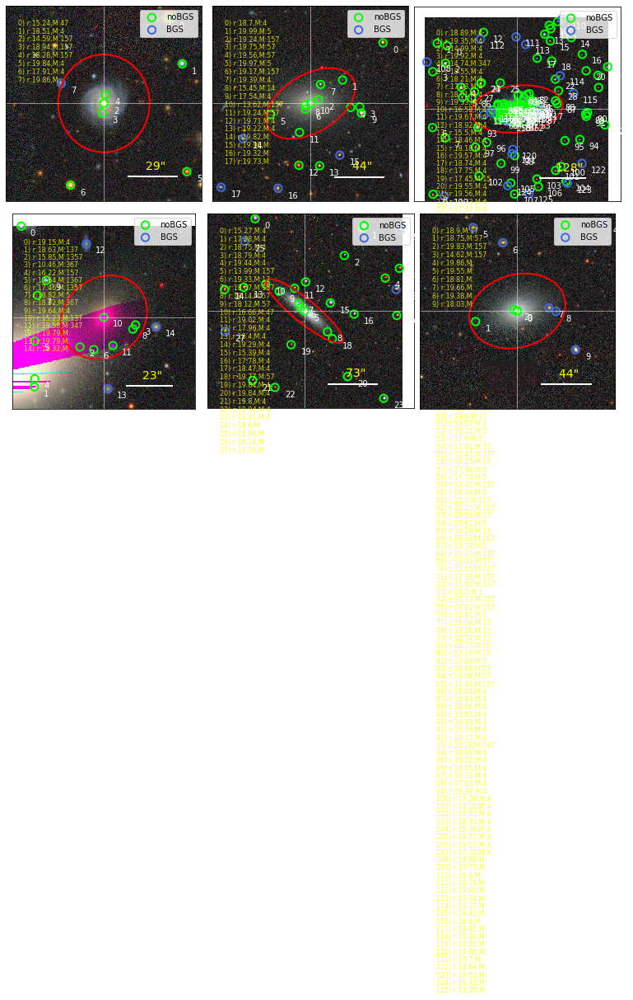

In [27]:
veto2 = {'noBGS':CUTOUT, 'BGS':~CUTOUT}
info2 = {'r':rmag,'M':BGS['CUTS']}

postages_circle(coord=[BGS['RA'], BGS['DEC']], centeridx=inQCidx, veto=veto2, info=info2, scale=0.262, 
                scale_unit='pixscale', layer=layer_dr7, radius=rad_, m=2, grid=[2,3], 
                savefile=None, layer2=None, layer2Mode='separate', isLG=True)

## Total Mag Vs Fibre mag of LSLGA galaxies rejected by FMC...

COMPLETENESS: 99.9991 %


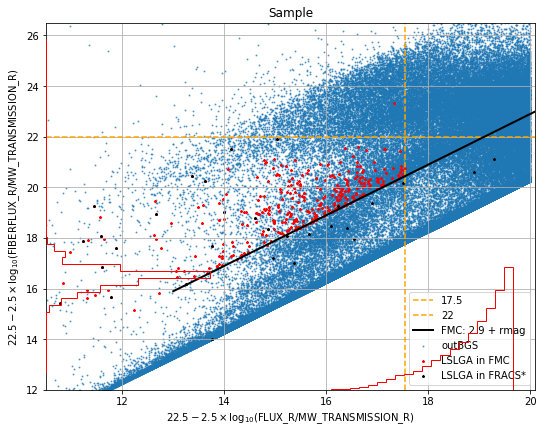

In [22]:
limit = [10.5, 20.1, 12, 26.5]
frac_density(pars=[rmag[CUTOUT], fibmag[CUTOUT], None ], pars2=[rmag[inFMCidx], fibmag[inFMCidx]], pars3=[rmag[inQCidx], fibmag[inQCidx]], 
             par_lab=['outBGS', 'LSLGA in FMC', 'LSLGA in FRACS*'], title='Sample', log=False, plot='scatter', limit=limit)

The rejection of LSLGA galaxies by FMC is not a problem by itself -we can recover/bring back this galaxies with the `REF` parameter in DR8- but  what about the galaxies that aren’t in LSLGA and are being threatened by FMC?

The LSLGA galaxies rejected by the FMC cut stop at rmag of ~17.5 and at fibmag of ~22 (with the exception of one galaxy at fibmag 23.3). We are going to take these limits to eye inspect the rejected objects with the postages but instead of looking to all the rejected objects we are going to ignore the rejected by the `Star-Galaxy separation cut` since is one of the most trustables -only Stars here- and the vast majority of the rejected objects come from this mask. Also, since we don't want to meet with any `LSLGA galaxy` or `Bright Star`, we are going to ignore the LG and BS cuts. We propose to do the eye inspection of small evenly separated (in fibmag) cells within a main slice:

    Main slice:
        fibmag < 22
        fibmag > 2.9 + rmag -- above current FMC thresshold
        
    Small cells:
        fibmag < 2.9 + rmag + dy[i+1]
        fibmag > 2.9 + rmag + dy[i]
        fibmag < 22
        rmag < dy[i+1]
        rmag > dy[i]
        
    Where: dx={13, 16, 17, 18, 18.5, 19.1}, dy={0.5, 1.0, 1.5}
   

In [31]:
def get_cells(plot=False):
    
    import itertools
    
    cells = Table()
    dy = [0, 0.4, 1.2, 2.0, 6.1]
    dx = [13, 22-(2.9+dy[3]), 22-(2.9+dy[2]), 22-(2.9+dy[1]), 19.1]
    
    MASK_2 = (CUTOUT) & (~SGT) & (~BST) & (~LGT) #Objects not rejected by SG, BS and LG
    
    for i,j in itertools.product(range(len(dx)-1), range(len(dy)-1)):
        
        MASK = np.ones(len(BGS), bool)
        MASK &= MASK_2
        MASK &= (rmag < dx[i+1]) & (rmag > dx[i])
        MASK &= (fibmag > 2.9 + rmag + dy[j]) & (fibmag < 2.9 + rmag + dy[j+1])
        MASK &= (fibmag < 22.)
        
        if np.sum(MASK) == 0:
            continue
        
        cell_label = '%i%i' %(i, j)
        cells[cell_label] = MASK
    
    print('%d cells found in main patch' %(len(cells.colnames)))
        
    if plot:
        
        plt.figure(figsize=(12,8))
        
        plt.scatter(rmag[MASK_2], fibmag[MASK_2], s=0.5, alpha=0.4, color='gray')
        for i,j in enumerate(cells.colnames):
            finCell = 100*np.sum(cells[j])/np.sum(MASK_2)
            plt.scatter(rmag[cells[j]], fibmag[cells[j]], s=2, label='%s, N=%d, f=%2.3g' %(j, np.sum(cells[j]), finCell))
        
        x = np.linspace(dx[0], 21, 10)
        plt.plot(x, 2.9 + x, lw=2, color='k', label='FMC: 2.9 + rmag')
        plt.axhline(22, lw=2, color='k')
        for i in dx:
            N2 = 3
            y2= np.linspace(i+2.9, 22, N2)
            plt.plot(np.full(N2, i), y2, color='red')
        for i in dy:
            x2= np.linspace(dx[0], 22-(2.9+i), N2)
            plt.plot(x2, 2.9 + x2 + i, color='red')
        
        plt.xlim(10.5, 20.1)
        plt.ylim(12, 26.5)
        plt.legend()
        plt.grid()
    
    return cells


10 cells found in main patch


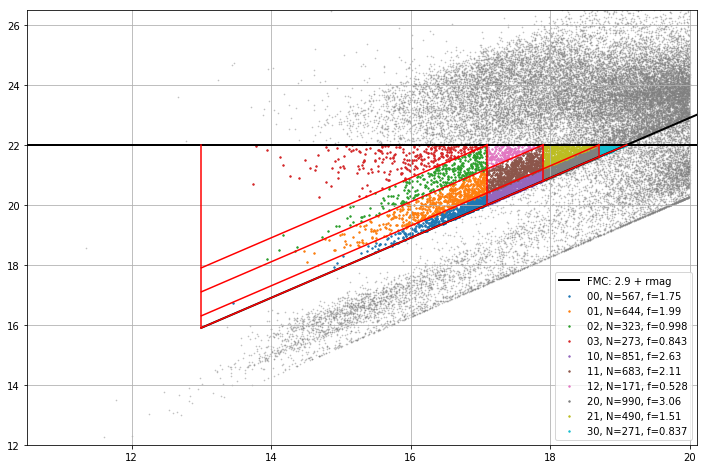

In [32]:
_ = get_cells(plot=True)

In [68]:
idx_slice1 = get_slices_idx(Slice='1')
idx_slice2 = get_slices_idx(Slice='2')
idx_slice3 = get_slices_idx(Slice='3')
idx_slice4 = get_slices_idx(Slice='4')
idx_slice5 = get_slices_idx(Slice='5')

2634 found
4173 found
2630 found
3472 found
2735 found


COMPLETENESS: 100 %


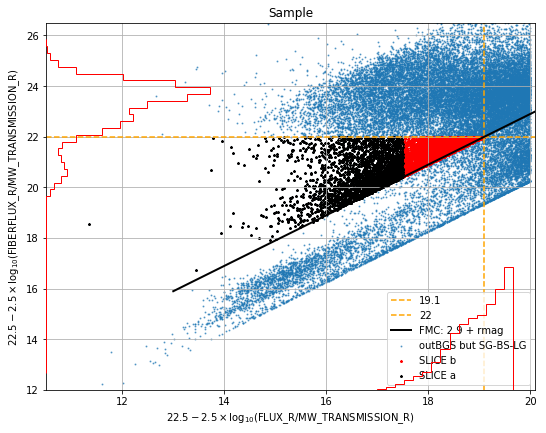

In [79]:
MASK = (CUTOUT) & (~SGT) & (~BST) & (~LGT)
limit = [10.5, 20.1, 12, 26.5]
frac_density(pars=[rmag[MASK], fibmag[MASK], None ], pars2=[rmag[idx_slice3], fibmag[idx_slice3]], pars3=[rmag[idx_slice1], fibmag[idx_slice1]], 
             par_lab=['outBGS but SG-BS-LG', 'SLICE b', 'SLICE a'], title='Sample', log=False, plot='scatter', limit=limit)

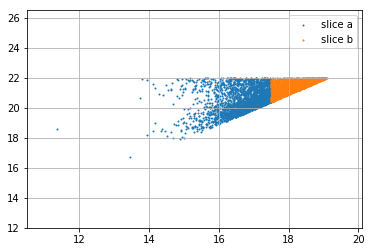

In [76]:
plt.figure(figsize=(6,4))
plt.scatter(rmag[idx_slice1], fibmag[idx_slice1], s=1, label='slice a')
#plt.scatter(rmag[idx_slice2], fibmag[idx_slice2], s=1, label='slice 2')
plt.scatter(rmag[idx_slice3], fibmag[idx_slice3], s=1, label='slice b')
#plt.scatter(rmag[idx_slice4], fibmag[idx_slice4], s=1, label='slice 4')
#plt.scatter(rmag[idx_slice5], fibmag[idx_slice5], s=1, label='slice 5')
plt.legend()
plt.grid()
plt.xlim(10.5, 20.1)
plt.ylim(12, 26.5)
plt.show()

Central coords in postage: RA:186.910805576413, DEC:12.261807979010, Cidx:192768, rad:0.75
Central coords in postage: RA:188.372352665978, DEC:7.202264146250, Cidx:36604, rad:0.75
Central coords in postage: RA:183.118022293051, DEC:5.607353071707, Cidx:65404, rad:0.75
Central coords in postage: RA:180.791636323932, DEC:14.289266201900, Cidx:270203, rad:0.75
Central coords in postage: RA:194.809094550413, DEC:7.114473876771, Cidx:388229, rad:0.75
Central coords in postage: RA:189.791825372945, DEC:9.719642515424, Cidx:38900, rad:0.75
Central coords in postage: RA:185.701573586484, DEC:5.266811935149, Cidx:122797, rad:0.75
Central coords in postage: RA:195.984507452430, DEC:13.691701041343, Cidx:631602, rad:0.75
Central coords in postage: RA:190.365001566343, DEC:8.871946218657, Cidx:396625, rad:0.75
Central coords in postage: RA:185.139226562855, DEC:12.228129138202, Cidx:290972, rad:0.75
Central coords in postage: RA:198.500958033696, DEC:12.235371480441, Cidx:709025, rad:0.75
Central 

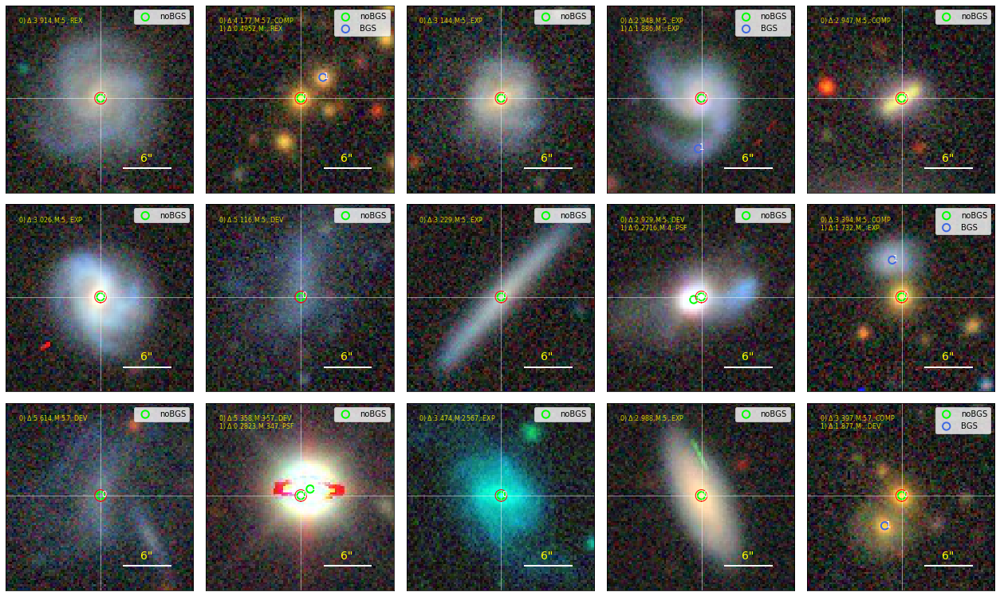

In [74]:
veto = {'noBGS':CUTOUT, 'BGS':~CUTOUT}
info = {'$\Delta$':fibmag-rmag,'M':BGS['CUTS'], '':BGS['TYPE']}

postages_circle(coord=[BGS['RA'], BGS['DEC']], centeridx=idx_slice1, veto=veto, info=info, scale=0.262, 
                scale_unit='pixscale', layer=layer_dr7, radius=1.5/2./3600, m=16, grid=[3,5], 
                savefile='dr7_slice_1', layer2=None, layer2Mode='separate', isLG=False)

Central coords in postage: RA:185.421832232357, DEC:6.701606422010, Cidx:107853, rad: 4
Central coords in postage: RA:194.732930226431, DEC:6.432368025385, Cidx:393333, rad: 4
Central coords in postage: RA:195.214772002783, DEC:5.754200656578, Cidx:428152, rad: 4
Central coords in postage: RA:188.313317336766, DEC:12.866067622454, Cidx:212353, rad: 4
Central coords in postage: RA:186.720520243340, DEC:11.545563586376, Cidx:331270, rad: 4
Central coords in postage: RA:189.051441407242, DEC:9.421964059583, Cidx:35249, rad: 4
Central coords in postage: RA:195.621319279827, DEC:11.163773381674, Cidx:599992, rad: 4
Central coords in postage: RA:195.549895609652, DEC:10.906607987621, Cidx:595807, rad: 4
Central coords in postage: RA:188.098448063668, DEC:14.982479112994, Cidx:207356, rad: 4
Central coords in postage: RA:190.241048320279, DEC:11.630952458154, Cidx:584791, rad: 4
Central coords in postage: RA:192.781592735111, DEC:10.893100802198, Cidx:649733, rad: 4
Central coords in postage:

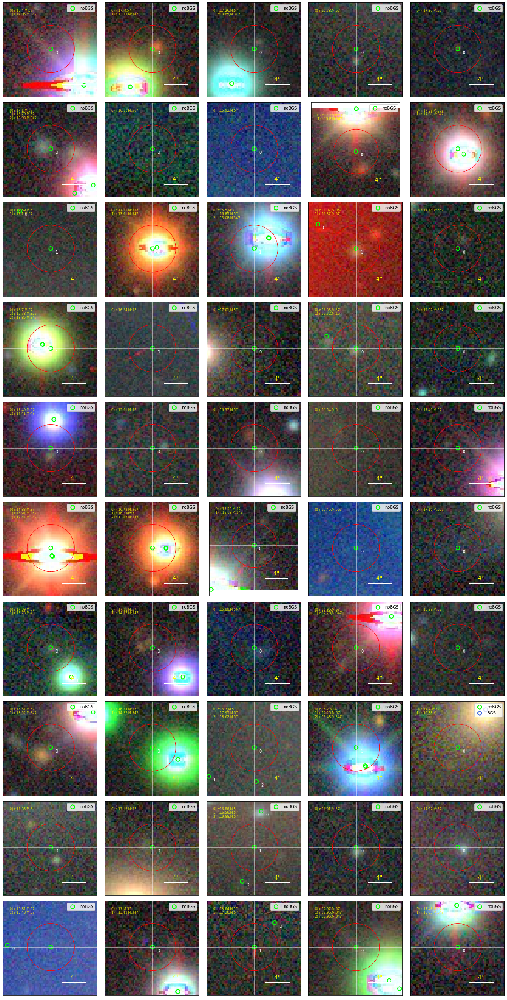

In [44]:
veto = {'noBGS':CUTOUT, 'BGS':~CUTOUT}
info = {'$\Delta$':fibmag-rmag,'M':BGS['CUTS'], '':BGS['TYPE']}

postages_circle(coord=[BGS['RA'], BGS['DEC']], centeridx=idx_slice2, veto=veto, info=info, scale=0.262, 
                scale_unit='pixscale', layer=layer_dr7, radius=4/3600, m=2, grid=[10,5], 
                savefile='dr7_slice_2', layer2=None, layer2Mode='separate', isLG=False)

Central coords in postage: RA:186.502753702821, DEC:11.232924580274, Cidx:325502, rad:0.75
Central coords in postage: RA:198.512901853064, DEC:7.705029243130, Cidx:532681, rad:0.75
Central coords in postage: RA:196.082580189849, DEC:10.064826874715, Cidx:630042, rad:0.75
Central coords in postage: RA:185.921320349954, DEC:9.555113400076, Cidx:119657, rad:0.75
Central coords in postage: RA:187.784573420264, DEC:5.185770865436, Cidx:16613, rad:0.75
Central coords in postage: RA:185.514471189413, DEC:13.313158398432, Cidx:289474, rad:0.75
Central coords in postage: RA:199.005447101547, DEC:14.888288741209, Cidx:544033, rad:0.75
Central coords in postage: RA:198.010494175132, DEC:7.261181044072, Cidx:528919, rad:0.75
Central coords in postage: RA:195.937162990699, DEC:14.863890527786, Cidx:602505, rad:0.75
Central coords in postage: RA:193.392880791490, DEC:7.458731580167, Cidx:510139, rad:0.75
Central coords in postage: RA:195.718689962042, DEC:13.156104684333, Cidx:606622, rad:0.75
Centr

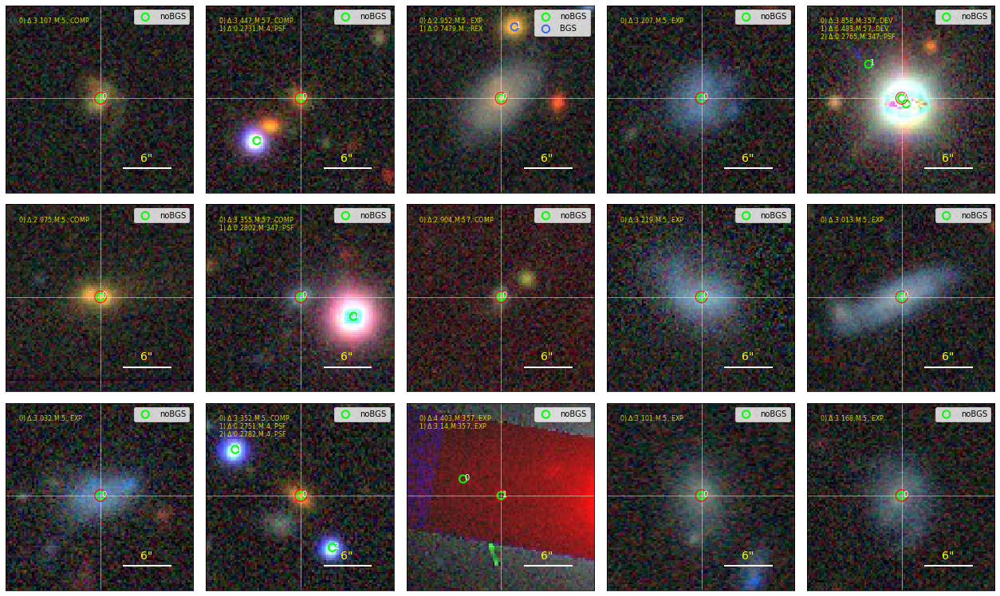

In [75]:
veto = {'noBGS':CUTOUT, 'BGS':~CUTOUT}
info = {'$\Delta$':fibmag-rmag,'M':BGS['CUTS'], '':BGS['TYPE']}

postages_circle(coord=[BGS['RA'], BGS['DEC']], centeridx=idx_slice3, veto=veto, info=info, scale=0.262, 
                scale_unit='pixscale', layer=layer_dr7, radius=1.5/2./3600., m=16, grid=[3,5], 
                savefile='dr7_slice_3', layer2=None, layer2Mode='separate', isLG=False)

Central coords in postage: RA:180.437803387595, DEC:6.935839064976, Cidx:91584, rad:0.75
Central coords in postage: RA:189.964807000754, DEC:10.208265770803, Cidx:216832, rad:0.75
Central coords in postage: RA:186.775311519690, DEC:13.323670921755, Cidx:328915, rad:0.75
Central coords in postage: RA:194.996600406482, DEC:11.948112377085, Cidx:565346, rad:0.75
Central coords in postage: RA:189.227491622800, DEC:7.258240603485, Cidx:42180, rad:0.75
Central coords in postage: RA:191.338245325278, DEC:11.202340153074, Cidx:611337, rad:0.75
Central coords in postage: RA:189.736363299342, DEC:6.173380831099, Cidx:43550, rad:0.75
Central coords in postage: RA:199.247267266187, DEC:5.647237910146, Cidx:363998, rad:0.75
Central coords in postage: RA:186.526652876216, DEC:13.103023182262, Cidx:337064, rad:0.75
Central coords in postage: RA:181.682807543363, DEC:14.392068219656, Cidx:310228, rad:0.75
Central coords in postage: RA:185.441269343990, DEC:12.086624241472, Cidx:295719, rad:0.75
Centra

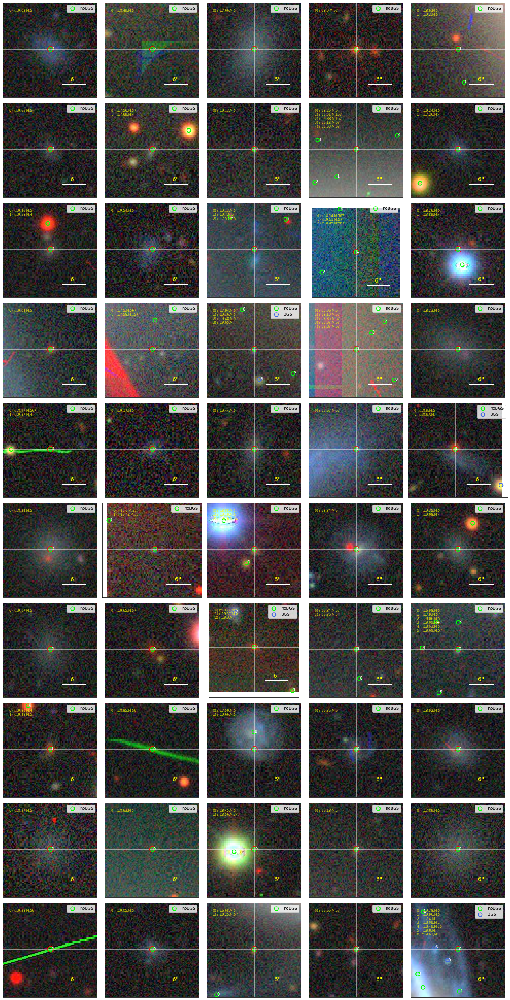

In [52]:
veto = {'noBGS':CUTOUT, 'BGS':~CUTOUT}
info = {'r':rmag,'M':BGS['CUTS']}

postages_circle(coord=[BGS['RA'], BGS['DEC']], centeridx=idx_slice4, veto=veto, info=info, scale=0.262, 
                scale_unit='pixscale', layer=layer_dr7, radius=1.5/2./3600., m=16, grid=[10,5], 
                savefile='dr7_slice_4', layer2=None, layer2Mode='separate', isLG=False)

Central coords in postage: RA:194.917955200352, DEC:6.895604490658, Cidx:395061, rad:0.75
Central coords in postage: RA:183.502073612765, DEC:8.468632649696, Cidx:62587, rad:0.75
Central coords in postage: RA:187.940523431320, DEC:13.821012610419, Cidx:195026, rad:0.75
Central coords in postage: RA:199.410466908441, DEC:7.007449580253, Cidx:368718, rad:0.75
Central coords in postage: RA:199.218772753705, DEC:7.516599490313, Cidx:371083, rad:0.75
Central coords in postage: RA:187.524370204655, DEC:14.515837322169, Cidx:191728, rad:0.75
Central coords in postage: RA:189.602453141459, DEC:5.856232397749, Cidx:41407, rad:0.75
Central coords in postage: RA:188.466973761319, DEC:8.174642583221, Cidx:22180, rad:0.75
Central coords in postage: RA:181.174911585871, DEC:11.360871382334, Cidx:304510, rad:0.75
Central coords in postage: RA:180.286988888603, DEC:5.891965696198, Cidx:95750, rad:0.75
Central coords in postage: RA:192.024739624541, DEC:7.287407702074, Cidx:441791, rad:0.75
Central coo

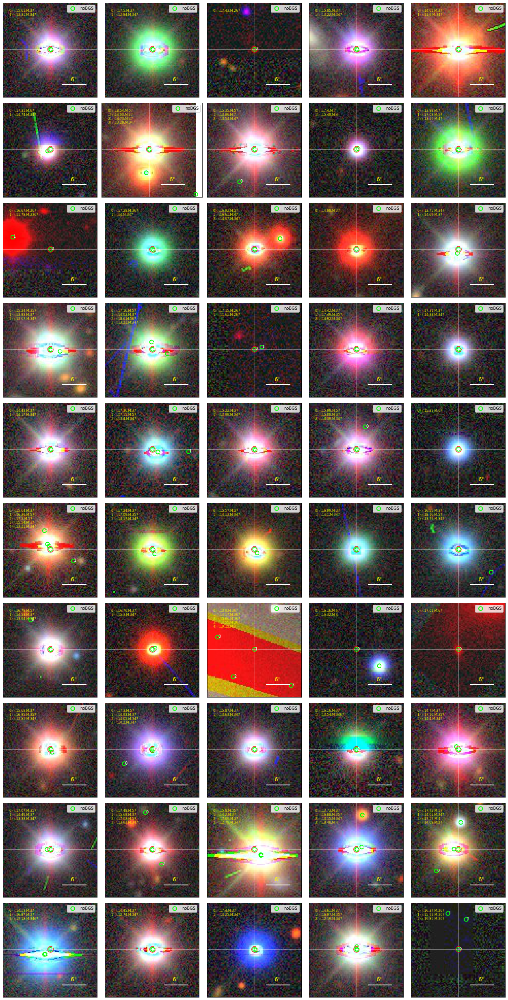

In [53]:
veto = {'noBGS':CUTOUT, 'BGS':~CUTOUT}
info = {'r':rmag,'M':BGS['CUTS']}

postages_circle(coord=[BGS['RA'], BGS['DEC']], centeridx=idx_slice5, veto=veto, info=info, scale=0.262, 
                scale_unit='pixscale', layer=layer_dr7, radius=1.5/2./3600., m=16, grid=[10,5], 
                savefile='dr7_slice_5', layer2=None, layer2Mode='separate', isLG=False)

# DEF...

In [18]:
def frac_density(pars, pars2, pars3, par_lab, title, log=True, plot='hexbin', limit=None):
    import matplotlib.colors as colors
    
    x = pars[0]
    y = pars[1]
    z = pars[2]
    
    mask = (~np.isnan(y)) & (~np.isinf(y)) & (~np.isnan(x)) & (~np.isinf(x)) 
    if z is not None:
        mask &= (~np.isnan(z)) & (~np.isinf(z))
    #if limit is not None:
    #    mask &= (coord[0] > limit[0]) & (coord[0] < limit[1]) & (coord[1] > limit[2]) & (coord[1] < limit[3])
    print('COMPLETENESS: %g %%' %(np.sum(mask)*100/len(pars[0])))
    x = x[mask]
    y = y[mask]
    if z is not None:
        z = z[mask]
    
    fig = plt.figure(figsize=(8, 6))
    
    left, width = 0.1, 0.85
    bottom, height = 0.1, 0.85

    rect_scatter = [left, bottom, width, height]
    rect_histx = [left, bottom, width, 0.3]
    rect_histy = [left, bottom, 0.3, height]
    colbar = [1.1, 0.1, 0.1, 0.85]

    axScatter = plt.axes(rect_scatter)
    axScatter.set_title(title)
    axHistx = plt.axes(rect_histx)
    axHisty = plt.axes(rect_histy)
    
    if log:
        bins = 'log'
        zlabel = r'$\log_{10}(W)$'
        norm = colors.LogNorm(vmin=z.min(), vmax=z.max())
    else:
        bins = None
        zlabel = r'$W$'
        norm = None
        
    if z is not None:
        cbaxes = fig.add_axes([1, 0.1, 0.03, 0.8])
        
    if plot == 'hexbin':
        #pos = axScatter.hexbin(x, y, C=z, gridsize=(80,80), cmap='seismic', bins=None, mincnt=1,label=r'test', vmin=-0.2, vmax=1)
        pos = axScatter.hexbin(x, y, C=z, gridsize=(50,50), cmap='seismic', bins=bins, mincnt=1)
        axScatter.set_facecolor('gray')
        fig.colorbar(pos, cax=cbaxes, label=zlabel)
    if plot == 'scatter':
        if z is not None:
            pos = axScatter.scatter(x, y, lw=0.1, c=z, cmap=plt.cm.get_cmap('seismic', 6), norm=norm)
            fig.colorbar(pos, cax=cbaxes, label=zlabel)
        else:
            #axScatter.scatter(x[~CUTOUT[mask]], y[~CUTOUT[mask]], s=1, alpha=0.6, label='inBGS')
            axScatter.scatter(x, y, s=1, alpha=0.6, label='%s' %(par_lab[0]))
            if pars2 is not None:
                axScatter.scatter(pars2[0], pars2[1], marker='*', s=5, color='r', label='%s' %(par_lab[1]))
                axScatter.axvline(pars2[0].max(), ls='--', color='orange', label='%2.3g' %(pars2[0].max()))
                #axScatter.axhline(pars2[1].max(), ls='--', color='orange', label='%2.3g' %(pars2[1].max()))
                axScatter.axhline(22.0, ls='--', color='orange', label='%2.3g' %(22.0))
            if pars3 is not None:
                axScatter.scatter(pars3[0], pars3[1], marker='*', s=5, color='k', label='%s' %(par_lab[2]))
            
        x2 = np.linspace(13, 20.1, 20)
        axScatter.plot(x2, 2.9 + x2, lw=2, color='k', label='FMC: 2.9 + rmag')
        axScatter.legend()

    axScatter.set_ylabel(r'$22.5 - 2.5\times \log_{10}$(%s/%s)' %('FIBERFLUX_R', 'MW_TRANSMISSION_R'))
    axScatter.set_xlabel(r'$22.5 - 2.5\times \log_{10}$(%s/%s)' %('FLUX_R', 'MW_TRANSMISSION_R'))
    #axScatter.set_xlabel(r'$2.5\times \log_{10}$(%s/%s)' %('FLUX_R', xcol))
    axScatter.grid()
    
    binsx = np.linspace(x.min(), x.max(), 50)
    binsy = np.linspace(y.min(), y.max(), 50)
    
    N1 = axHistx.hist(x, bins=binsx, cumulative=False, log=log, histtype='step', align='mid', color='red', linewidth=1)
    N2 = axHisty.hist(y, bins=binsy, cumulative=False, log=log, histtype='step', align='mid', color='red', linewidth=1, orientation='horizontal')
    
    if limit:
        axScatter.set_xlim(limit[0], limit[1])
        axScatter.set_ylim(limit[2], limit[3])

    axHistx.axis('off')
    axHisty.axis('off')

In [19]:
def self_match(df, MASK, MASK_N, SR):

    if MASK is None:
        MASK = np.ones(len(df), dtype='?')
        
    print('MASK (%s): %2.3g %%' %(MASK_N ,100*np.sum(MASK)/len(df)))

    idx2, idx1, d2d, d_ra, d_dec = search_around(df['RA'][MASK], df['DEC'][MASK], df['RA'][MASK], 
                                             df['DEC'][MASK], search_radius=SR)

    near = d2d > 0
    idx2_near = idx2[near]
    print('In search radius=%d: %2.3g %% out of a total in MASK' %(SR, 100*len(set(idx2_near))/np.sum(MASK)))
    print('In search radius=%d: %2.3g %% out of a total in whole catalogue' %(SR, 100*len(set(idx2_near))/len(df)))
    
    return MASK, MASK_N, SR, idx2_near

In [20]:
def coordtopix2(center, coord, size, scale):
    
    RA_pix = []
    DEC_pix = []
    #print('Center coords entering coordtopix: RA:%.12f, DEC:%.12f' %(center[0], center[1]))
    for i in range(len(coord[0])):
        #print('non-center coords entering coordtopix: RA:%.12f, DEC:%.12f' %(coord[0][i], coord[1][i]))
        #print('NORMAL:non-center coords entering coordtopix: RA:%f, DEC:%f' %(coord[0][i], coord[1][i]))
        #print('output diff center-coords in coordtopix: DRA:%.12f, DDEC:%.12f' %(center[0]-coord[0][i], center[1]-coord[1][i]))
        #print('NORMAL:output diff center-coords in coordtopix: DRA:%f, DDEC:%f' %(center[0]-coord[0][i], center[1]-coord[1][i]))
        print('RA_pix: %f, DEC_pix: %f' %(size/2. + (round(center[0], 12)-round(coord[0][i], 12))*3600./scale,
                                         size/2. + (round(center[1], 12)-round(coord[1][i], 12))*3600./scale))
        print('NORMAL:RA_pix: %f, DEC_pix: %f' %(float(size/2) + (center[0]-coord[0][i])*float(3600/scale),
                                         float(size/2) + (center[1]-coord[1][i])*float(3600/scale)))
        ra_pix = size/2. + (round(center[0], 12)-round(coord[0][i], 12))*3600./scale
        dec_pix = size/2. + (round(center[1], 12)-round(coord[1][i], 12))*3600./scale
        RA_pix.append(ra_pix)
        DEC_pix.append(dec_pix)
    
    return RA_pix, DEC_pix

def coordtopix(center, coord, size, scale):
    
    RA_pix = []
    DEC_pix = []
    for i in range(len(coord[0])):
        d_ra = (center[0]-coord[0][i])*3600
        d_dec = (center[1]-coord[1][i])*3600
        if d_ra > 180*3600:
            d_ra = d_ra - 360.*3600
        elif d_ra < -180*3600:
            d_ra = d_ra + 360.*3600
        else:
            d_ra = d_ra
        d_ra = d_ra * np.cos(coord[1][i]/180*np.pi)
        
        ra_pix = size/2. + d_ra/scale
        dec_pix = size/2. + d_dec/scale
        RA_pix.append(ra_pix)
        DEC_pix.append(dec_pix)
    
    return RA_pix, DEC_pix

def disttopix(D, scale):
    '''
    D must be in arcsec...
    '''
    
    dpix = D/scale
    
    return dpix


def plot_circle_img(coord, centeridx, veto=None, info=None, scale=0.262, scale_unit='pixscale', layer='decals-dr7', 
                    radius=None, m=4, ax=plt, isLG=None):
    
    from astropy.utils.data import download_file  #import file from URL
    from matplotlib.ticker import NullFormatter
    from matplotlib.patches import Ellipse
        
    RAidx = coord[0][centeridx] #centre
    DECidx = coord[1][centeridx] #centre
        
    if isLG:
        print('Central coords in postage: RA:%.12f, DEC:%.12f, Cidx:%d, rad:%2.2g' %(RAidx, DECidx, centeridx, radius[0]*3600))
        ramin, ramax = RAidx-m*radius[0], RAidx+m*radius[0]
        decmin, decmax = DECidx-m*radius[0], DECidx+m*radius[0]
        #postage image sizes
        boxsize = 2*m*radius[0]*3600
        size = int(round(boxsize/scale))
        rad_pix = disttopix(radius[0]*3600., scale=scale)
        major_pix = disttopix(D=radius[0]*3600, scale=scale)
        minor_pix = disttopix(D=radius[1]*3600, scale=scale)
    
        ellipse = Ellipse((size/2., size/2.), width=2*major_pix, height=2*minor_pix, angle=radius[2],
                       edgecolor='r', fc='None', lw=2, ls='-')
    else:
        print('Central coords in postage: RA:%.12f, DEC:%.12f, Cidx:%d, rad:%2.2g' %(RAidx, DECidx, centeridx, radius*3600))
        ramin, ramax = RAidx-m*radius, RAidx+m*radius
        decmin, decmax = DECidx-m*radius, DECidx+m*radius
        #postage image sizes
        boxsize = 2*m*radius*3600
        size = int(round(boxsize/scale))
        rad_pix = disttopix(radius*3600., scale=scale)
        angle_array = np.linspace(0, 2*np.pi, 240)
        x = size/2 - rad_pix * np.sin(angle_array)
        y = size/2 - rad_pix * np.cos(angle_array)
        #x = RAidx - radius * np.sin(angle_array)
        #y = DECidx - radius * np.cos(angle_array)
        #x_pix, y_pix = coordtopix(center=[RAidx, DECidx], coord=[x, y], size=size, scale=scale)
    
    mask = (coord[0] > ramin) & (coord[0] < ramax) & (coord[1] > decmin) & (coord[1] < decmax)
    #print('pixels:',size)
    scale_l = np.array([[size*5/8, size*7/8], [size*1/8, size*1/8]])
    
    colours = ['lime', 'royalblue', 'purple', 'orange']

    de_cutout_url = 'http://legacysurvey.org/viewer-dev/jpeg-cutout/?ra=%.12f&dec=%.12f&%s=%g&layer=%s&size=%g' % (RAidx, DECidx, scale_unit, scale, layer, size)
    img = plt.imread(download_file(de_cutout_url,cache=True,show_progress=False,timeout=120))
    if ax == plt:
        fig = plt.figure(figsize=(6,6))
    else:
        ax.xaxis.set_major_formatter(NullFormatter())
        ax.yaxis.set_major_formatter(NullFormatter())
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
    ax.imshow(img, origin='lower', aspect='equal')
    ax.axvline(size/2, lw=1, color='white', alpha=0.5)
    ax.axhline(size/2, lw=1, color='white', alpha=0.5)
    ax.plot(scale_l[0], scale_l[1], lw=2, color='white')
    ax.text(size*5.7/8, size*1.3/8, '%i" ' %(boxsize/4), color='yellow', size=14)
    if isLG:
        ax1 = plt.gca()
        ax1.add_patch(ellipse)
    else:
        #ax.plot(x_pix, y_pix, 'red', lw=1)
        ax.plot(x, y, 'red', lw=1)
    
    if veto is not None:
        rapix = []
        decpix = []
        IDX1 = []
        j= 0
        for i in veto:
            if np.sum((veto[i]) & (mask)) < 1:
                j += 1
                continue
                
            rav = coord[0][(veto[i]) & (mask)]
            decv = coord[1][(veto[i]) & (mask)]
            #print('All coords in postage: RA:%.12f, DEC:%.12f' %(rav[1], decv[1]))
            ravpix, decvpix = coordtopix(center=[RAidx, DECidx], coord=[rav, decv], size=size, scale=scale)
            ax.scatter(ravpix, decvpix, marker='.', s = 350, facecolors='none', edgecolors=colours[j], lw=2, label='%s' %(i))
            for i2 in range(len(ravpix)):
                rapix.append(ravpix[i2])
                decpix.append(decvpix[i2])
                IDX1.append(list(np.where((veto[i]) & (mask))[0])[i2])
            j += 1
            
        v0 = np.zeros(len(veto[list(veto.keys())[0]]), dtype='?')
        for i,j in enumerate(list(veto.keys())):
            v0 |= veto[j]
        v0m = (~v0) & (mask)
        if np.sum(v0m) > 0:
            rav1 = coord[0][v0m]
            decv1 = coord[1][v0m]
            ravpix1, decvpix1 = coordtopix(center=[RAidx, DECidx], coord=[rav1, decv1], size=size, scale=scale)
            ax.scatter(ravpix1, decvpix1, marker='.', s = 300, facecolors='none', edgecolors='red', lw=2, label='other')
            for i1 in range(len(ravpix1)):
                rapix.append(ravpix1[i1])
                decpix.append(decvpix1[i1])
                IDX1.append(list(np.where(v0m)[0])[i1])
        
        if info is not None:
            j2 = 9*size/10
            for k in range(len(rapix)):
                ax.text(rapix[k]+rad_pix*0.20, decpix[k]-rad_pix*0.20, '%s' %(k), color='white')
                txt = []
                for l in info:
                    val = info[l][IDX1[k]]
                    if isinstance(val, (float, np.float32, np.float64)):
                        txti = '%s:%2.4g' %(l,val)
                    elif isinstance(val, str):
                        txti = '%s:%s' %(l,val)
                    elif isinstance(val, int):
                        txti = '%s:%i' %(l,val)
                    txt.append(txti)
                ax.text(size/16,j2, '%i) %s' %(k, ','.join(txt)), fontsize=8,color='yellow', alpha=0.8)
                j2 -= size/24
                
        ax.legend(loc = 'upper right')
    else:
        rav = coord[0][mask]
        decv = coord[1][mask]
        rapix, decpix = coordtopix(center=[RAidx, DECidx], coord=[rav, decv], size=size, scale=scale)
        ax.scatter(rapix, decpix, marker='.', s = 300, facecolors='none', edgecolors='lime', lw=2)
        
    if ax == plt:
        return fig
    

def postages_circle(coord, centeridx, veto=None, info=None, scale=0.262, scale_unit='pixscale', layer='decals-dr7', 
                    radius=None, m=4, grid=None, savefile=None, layer2=None, layer2Mode='merge', isLG=False):
    '''
    Create a postage image (or a table of images) from selected object(s).
    
    coord::class:`2D-array`
        RA, DEC coordinates of catalogue/dataframe of interest.
    centeridx::class:`array or int`
        Index(es) of the object(s) that will be at the centre of the postage(s). The index have to follow the catalogue/dataframe indexes.
    veto::class:`dictionary-boolean-array`
        Dictionary-array containing boolean-arrays that will be shown in the postages as labels. These need to have same lenght as coord and same indexes.
    info::class:`dictionary-boolean-array`    
        
        '''
    
    import matplotlib.gridspec as gridspec
    import random

    if grid is not None:
        
        if not isinstance(centeridx, np.ndarray):
            raise ValueError('If using grid use a proper list of index at centeridx...')
            
        rows, cols = grid[0], grid[1]
        if (layer2 is not None) & (layer2Mode == 'merge'):
            figsize = (4.5*cols, 4.5*rows*2)
            gs = gridspec.GridSpec(rows*2, cols)
        else:
            figsize = (4.5*cols, 4.5*rows)
            gs = gridspec.GridSpec(rows, cols)
            
        gs.update(wspace=0.001, hspace=0.06)
        idx_list = random.sample(list(centeridx), rows*cols)

        fig = plt.figure(num=1, figsize=figsize)
        ax = []
        
        for i, j in enumerate(idx_list):
            
            if isinstance(radius, np.ndarray):
                radius2 = radius[j]
                #print(j, radius2*3600)
            else:
                radius2 = radius
                
            if (layer2 is not None) & (layer2Mode == 'merge'):
                row = (i // cols)*2
            else:
                row = (i // cols)
            col = i % cols

            ax.append(fig.add_subplot(gs[row, col]))
            plot_circle_img(coord=coord, centeridx=j, veto=veto, info=info, scale=scale, 
                scale_unit=scale_unit, layer=layer, radius=radius2, m=m, ax=ax[-1], isLG=isLG)
            
            if (layer2 is not None) & (layer2Mode == 'merge'):
                ax.append(fig.add_subplot(gs[row+1, col]))
                plot_circle_img(coord=coord, centeridx=j, veto=veto, info=info, scale=scale, 
                        scale_unit=scale_unit, layer=layer2, radius=radius2, m=m, ax=ax[-1], isLG=isLG)
                    
            if (layer2 is not None) & (layer2Mode == 'separate'):
                fig2 = plt.figure(num=2, figsize=figsize)
                ax2 = []
                ax2.append(fig2.add_subplot(gs[row, col]))
                plot_circle_img(coord=coord, centeridx=j, veto=veto, info=info, scale=scale, 
                        scale_unit=scale_unit, layer=layer2, radius=radius2, m=m, ax=ax2[-1], isLG=isLG)
            
    else:
        if isinstance(centeridx, np.ndarray):
            raise ValueError('If Not using grid do not use a list of index at centeridx...')
            
        if (isinstance(radius, np.ndarray)) & (~isLG):
            raise ValueError('If Not using grid do not use a list of radius...')
        
        fig = plot_circle_img(coord=coord, centeridx=centeridx, veto=veto, info=info, scale=scale, 
                scale_unit=scale_unit, layer=layer, radius=radius, m=m, ax=plt, isLG=isLG)
    
    if savefile is not None:
        if (layer2 is not None) & (layer2Mode == 'separate'):
            fig.savefig(savefile +'.png', bbox_inches = 'tight', pad_inches = 0)
            fig2.savefig(savefile + '_%s' %(layer2[-5:]) + '.png', bbox_inches = 'tight', pad_inches = 0)
        elif (layer2 is not None) & (layer2Mode == 'merge'):
            fig.savefig(savefile + '_%s' %(layer2[-5:]) + '.png', bbox_inches = 'tight', pad_inches = 0)
        else:
            fig.savefig(savefile +'.png', bbox_inches = 'tight', pad_inches = 0)
        
    

In [21]:
#Rongpu's circ radii
rongpuLRG_radii = [[4.0, 210.],[4.5, 210.], [5.5, 200.], [6.25, 150.], [6.75, 125.],
                   [7.25, 120.], [7.75, 110.], [8.25, 100.], [8.75,  75.], [9.25,  60.],
                   [9.75,  55.], [ 10.25,  50.], [ 10.75,  48.], [ 11.25,  40.], [ 11.75,  37.], 
                   [ 12.25,  25.], [ 12.75,  20.], [ 13.25,  18.], [ 13.75,  16.], [ 14.25,  12.], 
                   [ 14.75,  11.], [ 15.25,  11.], [ 15.75,  10.]]

#Rongpu's length radii (diff spikes)
rongpuLRG_length_radii = [[4.0, 600.], [4.5, 600.], [5.5, 600.], [6.25, 540.], [6.75, 520.], [7.25, 500.], 
                   [7.75, 320.], [8.25, 300.], [8.75, 290.], [9.25, 160.], [9.75, 150.], [ 10.25, 140.],
                   [ 10.75, 130.], [ 11.25, 130.], [ 11.75, 100.], [ 12.25, 60.], [ 12.75, 40.], [ 13., 40.]]

#Rongpu's widht radii (diff spikes)
rongpuLRG_widht_radii = [[8., 25.], [13., 16.]]

#kyle_radii's = rongpuLRG_radii's/np.sqrt(2)
kyle_radii = []
for i in range(len(rongpuLRG_radii)):
    kyle_radii.append([rongpuLRG_radii[i][0], rongpuLRG_radii[i][1]/np.sqrt(2)])

kyle_length_radii = []
for i in range(len(rongpuLRG_length_radii)):
    kyle_length_radii.append([rongpuLRG_length_radii[i][0], rongpuLRG_length_radii[i][1]/np.sqrt(2)])

kyle_widht_radii = []
for i in range(len(rongpuLRG_widht_radii)):
    kyle_widht_radii.append([rongpuLRG_widht_radii[i][0], rongpuLRG_widht_radii[i][1]/np.sqrt(2)])
    
#TWOMASS radii
twomass_radii = [[9.5,100], [10.5, 80], [11.5, 70], [12.5, 50], [13.5, 30], 
                 [14.5, 20], [15.5, 10], [16.5, 5]]

#LSLGA radii
LSLGA_radii = [[9.5,100], [10.5, 90], [11.5, 80], [12.5, 70], [13.5, 60], 
               [14.5, 50], [15.5, 35], [16.5, 25], [17.5, 15], [17.5, 10], [18, 8]]

#Dustin_radii's
mag = np.linspace(0, 20, 50)
Dustin_MS_radii = []
for i,j in enumerate(mag):
    Dustin_MS_radii.append([j, np.minimum(1800., 150. * 2.5**((11. - j)/3.)) * 0.262/1])

# DEV ZONE...

## Search pairs within GAIA sources

To find the closest pairs whitin a `3 arcsec` radius we made use of `search_around` function with the same catalogue for both entries... As expected, the function found more than 100% of objects because we are using the same catalogue twice to find their closest friends we will always find the object itself from the other catalogue. To remove the pairs that found themself in the other catalogue we use the distance parameter and remove everything that whose separation is equal to zero.

In this case we start up with the original catalogue and reject everything that is not in GAIA, this means we are keeping `'GAIA_PHOT_G_MEAN_MAG' != 0` with the purpose of find all kinf of pairs (rejected and not rejected by BGS cuts) that are in GAIA. Keeping only GAIA sources we left with $55.7 \%$ out of the total catalogue and after the `3 arcsec` search we left with $2.24 \%$ out of the total in GAIA and $1.25 \%$ out of the total catalogue.

In the following gallery we show some of the pairs with at least one of them being in the final BGS catalogue, his partner might or not being in the final BGS catalogue since the search of pairs depends only of being or not in GAIA. However, we also distinguish between being or not in the final BGS catalogue by including a label indicating its `magnitude in r`, its `morphology` and its `BGS mask(s)` if any.

In [5]:
#MASK1, MASK_N1, SR1, idx2_near1 = self_match(df=BGS, MASK=None, MASK_N='None', SR=4)
SR1 = 1.5 #DESI fiber size
veto1 = {'noBGS':CUTOUT, 'BGS':~CUTOUT}
#CM1 = list(veto1.keys())[2] #Centre Mask
info1 = {'r':rmag, '':BGS['TYPE'],'M':BGS['CUTS']}

#IDX01 = (veto1[CM1])[idx2_near1]*idx2_near1
IDX1 = np.where(~CUTOUT)
CM1 = 'BGS_only'
#IDX1 = IDX01[IDX01 != 0]
#print('IN SELECTION: %i ---> OUT SELECTION: %i' %(np.sum(IDX01 > 0), np.sum(IDX01 == 0)))

postages_circle(coord=[BGS['RA'], BGS['DEC']], centeridx=list(IDX1)[0], veto=veto1, info=info1, scale=0.262, 
                scale_unit='pixscale', layer='dr8c-decam', radius=SR1/3600., m=5, grid=[2,2], 
                savefile=None, layer2='dr8c-decam-model', layer2Mode='separate')

#savefile='%s_SR:%d_CM:%s_V:%s' %('dr8',SR1, CM1, '-'.join(list(veto1.keys())))

NameError: name 'postages_circle' is not defined

MASK (GAIA): 55.7 %
406519 nearby objects ~ 102.892 %
In search radius=4: 2.84 % out of a total in MASK
In search radius=4: 1.58 % out of a total in whole catalogue
IN SELECTION: 246 ---> OUT SELECTION: 11180


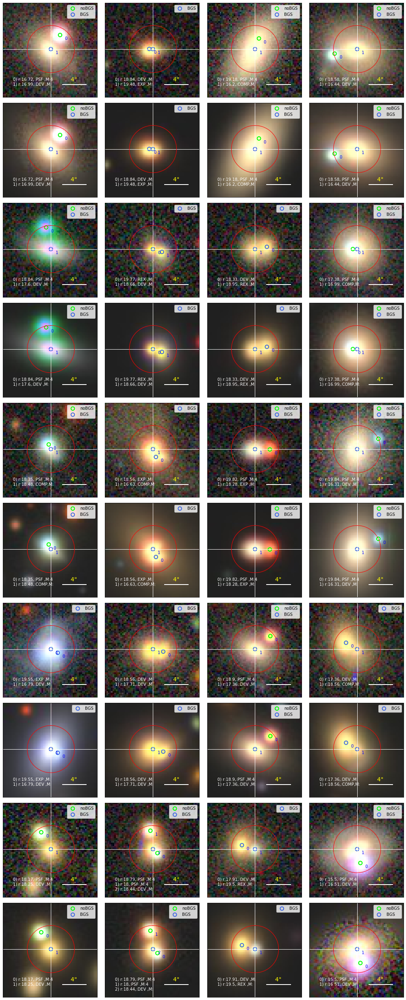

In [191]:
MASK2, MASK_N2, SR2, idx2_near2 = self_match(df=BGS, MASK=gaia, MASK_N='GAIA', SR=4)
veto2 = {'noBGS':CUTOUT[MASK2], 'BGS':~CUTOUT[MASK2]}
CM2 = list(veto2.keys())[1] #Centre Mask
info2 = {'r':rmag[MASK2], '':BGS['TYPE'][MASK2],'M':BGS['CUTS'][MASK2]}

IDX02 = (veto2[CM2])[idx2_near2]*idx2_near2
IDX2 = IDX02[IDX02 != 0]
print('IN SELECTION: %i ---> OUT SELECTION: %i' %(np.sum(IDX02 > 0), np.sum(IDX02 == 0)))

postages_circle(coord=[BGS['RA'][MASK2], BGS['DEC'][MASK2]], centeridx=IDX2, veto=veto2, info=info2, scale=0.262, 
                scale_unit='pixscale', layer='decals-dr7', radius=SR2/3600., m=2, grid=[5,4], 
                savefile='%s_SR:%d_M:%s_CM:%s_V:%s' %('dr7',SR2, MASK_N2, CM2, '-'.join(list(veto2.keys()))), 
                layer2='decals-dr7-model', layer2Mode='merge')


MASK (BGS): 38.4 %
275430 nearby objects ~ 101.108 %
In search radius=4: 1.07 % out of a total in MASK
In search radius=4: 0.41 % out of a total in whole catalogue
IN SELECTION: 322 ---> OUT SELECTION: 2696


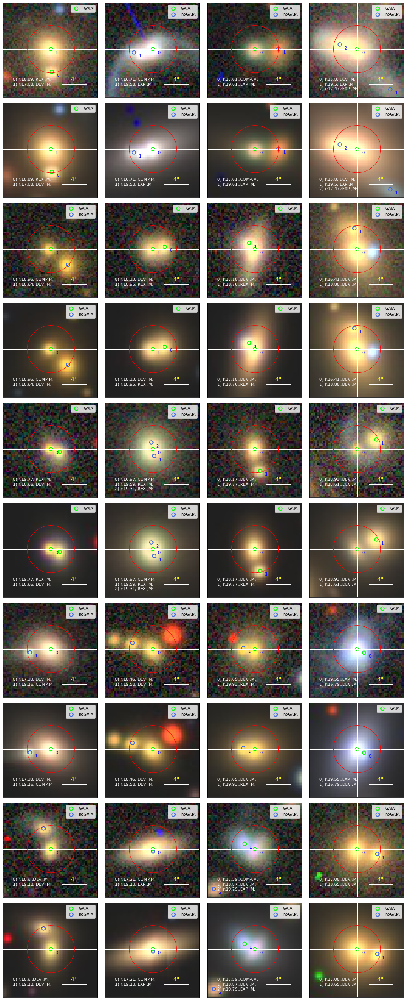

In [192]:
MASK3, MASK_N3, SR3, idx2_near3 = self_match(df=BGS, MASK=~CUTOUT, MASK_N='BGS', SR=4)
veto3 = {'GAIA':gaia[MASK3], 'noGAIA':~gaia[MASK3]}
CM3 = list(veto3.keys())[0] #Centre Mask
info3 = {'r':rmag[MASK3], '':BGS['TYPE'][MASK3],'M':BGS['CUTS'][MASK3]}

IDX03 = (veto3[CM3])[idx2_near3]*idx2_near3
IDX3 = IDX03[IDX03 != 0]
print('IN SELECTION: %i ---> OUT SELECTION: %i' %(np.sum(IDX03 > 0), np.sum(IDX03 == 0)))

postages_circle(coord=[BGS['RA'][MASK3], BGS['DEC'][MASK3]], centeridx=IDX3, veto=veto3, info=info3, scale=0.262, 
                scale_unit='pixscale', layer='decals-dr7', radius=SR3/3600., m=2, grid=[5,4], 
                savefile='%s_SR:%d_M:%s_CM:%s_V:%s' %('dr7',SR3, MASK_N3, CM3, '-'.join(list(veto3.keys()))), 
                layer2='decals-dr7-model', layer2Mode='merge')

MASK (BGS&GAIA): 2.85 %
20324 nearby objects ~ 100.465 %
In search radius=4: 0.465 % out of a total in MASK
In search radius=4: 0.0132 % out of a total in whole catalogue
IN SELECTION: 85 ---> OUT SELECTION: 9


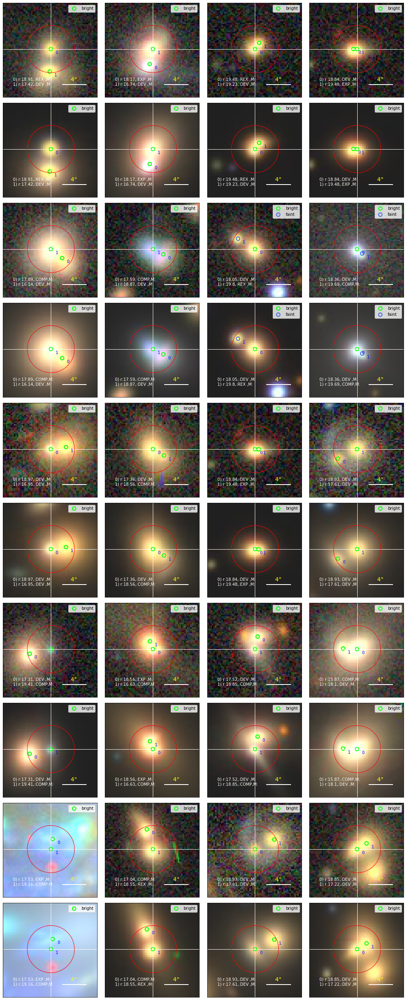

In [193]:
MASK4, MASK_N4, SR4, idx2_near4 = self_match(df=BGS, MASK=(~CUTOUT & gaia), MASK_N='BGS&GAIA', SR=4)
veto4 = {'bright':bright[MASK4], 'faint':faint[MASK4]}
CM4 = list(veto4.keys())[0] #Centre Mask
info4 = {'r':rmag[MASK4], '':BGS['TYPE'][MASK4],'M':BGS['CUTS'][MASK4]}

IDX04 = (veto4[CM4])[idx2_near4]*idx2_near4
IDX4 = IDX04[IDX04 != 0]
print('IN SELECTION: %i ---> OUT SELECTION: %i' %(np.sum(IDX04 > 0), np.sum(IDX04 == 0)))

postages_circle(coord=[BGS['RA'][MASK4], BGS['DEC'][MASK4]], centeridx=IDX4, veto=veto4, info=info4, scale=0.262, 
                scale_unit='pixscale', layer='decals-dr7', radius=SR4/3600., m=2, grid=[5,4], 
                savefile='%s_SR:%d_M:%s_CM:%s_V:%s' %('dr7',SR4, MASK_N4, CM4, '-'.join(list(veto4.keys()))), 
                layer2='decals-dr7-model', layer2Mode='merge')

In [5]:
RA = BGS[idx2[near]]['RA']
DEC = BGS[idx2[near]]['DEC']

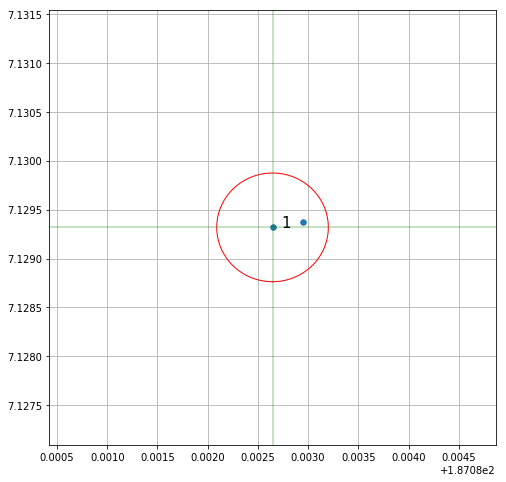

In [176]:
n = 250
n2 = 4
radius = 2/3600.
plt.figure(figsize=(8,8))
plt.scatter(RA, DEC, s=30)

angle_array = np.linspace(0, 2*np.pi, 240)
x = RA[n] - radius * np.sin(angle_array)
y = DEC[n] - radius * np.cos(angle_array)
plt.plot(x, y, 'red', lw=1)
plt.text(RA[n]+radius*0.15, DEC[n], '1', size=15)

plt.axhline(DEC[n], c='green', alpha=0.3)
plt.axvline(RA[n], c='green', alpha=0.3)

plt.xlim(RA[n]-n2*radius, RA[n]+n2*radius)
plt.ylim(DEC[n]-n2*radius, DEC[n]+n2*radius)
plt.grid()